### Imports

In [1]:
import sys
import os
# Get the parent directory of 'tests'
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))

# Add the project root to sys.path if not already present
if project_root not in sys.path:
    sys.path.append(project_root)
import cv2 as cv
import re
from scripts import tf_text_graph_common
import tensorflow  as tf
import numpy as np
import matplotlib.pyplot as plt

#from scripts.video_source import VideoSource
from scripts import tf_text_graph_ssd

#### Get the model paths

In [2]:
inference_graph = "../models/ssd_mobilenet_v2_coco_2018_03_29/saved_model/frozen_inference_graph.pb"
config = "../models/ssd_mobilenet_v2_coco_2018_03_29/saved_model/ssd_mobilenet_v2_coco_2018_03_29.pbtxt"

In [4]:
# Read yolo model
ssd = cv.dnn.readNetFromDarknet(config, inference_graph)
ssd.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
ln = ssd.getLayerNames()
print(len(ln), ln)

error: OpenCV(4.11.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/dnn/src/darknet/darknet_io.cpp:705: error: (-215:Assertion failed) separator_index < line.size() in function 'ReadDarknetFromCfgStream'


In [4]:
## Output path
#config_file = "models/ssd_mobilenet_v2_coco_2018_03_29/saved_model/ssd_mobilenet_v2_coco_2018_03_29.pbtxt"
#
## creat ssd graph
#tf_text_graph_ssd.createSSDGraph(model_file, pipeline_config, config_file)

In [5]:
# Get class labels
with open("models/ssd_mobilenet_v2_coco_2018_03_29/labels.txt", "r") as f:
    labels = f.read().split("\n")

#### Read the Tensorflow model

In [6]:
ssd = cv.dnn.readNetFromTensorflow(inference_graph, config)

In [7]:
def ssd_detect_objects(net, im):
    dim = 300

    blob = cv.dnn.blobFromImage(im, size=(dim, dim), swapRB=True, crop=False)

    net.setInput(blob)

    objects = net.forward()

    return objects

In [8]:
def yolo_detect_objects(net, im):
    dim = 416

    blob = cv.dnn.blobFromImage(im, 1 / 255.0, (dim, dim), swapRB=True, crop=False)
    net.setInput(blob)

    objects = net.forward()

    return objects

In [9]:
def display_text(im, text, x, y):
    # Get text size and baseline
    text_size = cv.getTextSize(text, cv.FONT_HERSHEY_SIMPLEX, 0.6, 1)
    dim = text_size[0]
    baseline = text_size[1]
    
    # Draw a filled rectangle for text background
    cv.rectangle(im, (x, y - dim[1] - baseline), (x + dim[0], y+baseline), (255, 255, 255), cv.FILLED)
    
    # Overlay the text on top
    cv.putText(im, text, (x, y - baseline), cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1, cv.LINE_AA)

In [10]:
def ssd_display_objects_static(im, objects, threshold=0.25):

    rows = im.shape[0]; cols = im.shape[1]

    for i in range(objects.shape[2]):

        class_id = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Retrieve original coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols) - x
        h = int(objects[0, 0, i, 6] * rows) - y

        # Check if score is above threshold
        if score > threshold:

            # Display bounding box
            display_text(im, f"  {labels[class_id-1]} {round(score,2)}  ", x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert image to RGB
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10)); plt.imshow(mp_img); plt.axis('off'), plt.show()

In [11]:
def yolo_display_objects_static(im, objects, threshold=0.25):

    rows = im.shape[0]; cols = im.shape[1]

    for i in range(objects.shape[2]):

        class_id = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Retrieve original coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols) - x
        h = int(objects[0, 0, i, 6] * rows) - y

        # Check if score is above threshold
        if score > threshold:

            # Display bounding box
            display_text(im, f"  {labels[class_id-1]} {round(score,2)}  ", x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert image to RGB
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10)); plt.imshow(mp_img); plt.axis('off'), plt.show()

In [12]:
def display_objects_live(im, objects, threshold=0.25):

    rows = im.shape[0]; cols = im.shape[1]

    for i in range(objects.shape[2]):

        class_id = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Retrieve original coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols) - x
        h = int(objects[0, 0, i, 6] * rows) - y

        # Check if score is above threshold
        if score > threshold:

            # Display bounding box
            display_text(im, f"  {labels[class_id-1]} {round(score,2)}  ", x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert image to RGB
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)

#### Person tensor

In [13]:
def crop_persons(im):

    dim = 300

    blob = cv.dnn.blobFromImage(im, size=(dim, dim), swapRB=True, crop=False)

    ssd.setInput(blob)

    filtered_detections = ssd.forward()

    # Drop all that are not persons
    detections = filtered_detections[0, 0, :, :]  # Shape: (100, 7)
    filtered_detections = detections[detections[:, 1] == 1]  # Filter class 1 (person)
    print(filtered_detections.shape)
    # Get image dimensions
    rows = im.shape[0]; cols = im.shape[1]

    # Create a list to store cropped images
    crops = []
    for i in range(filtered_detections.shape[0]):
        class_id = int(filtered_detections[i, 1])
        score = float(filtered_detections[i, 2])
        x = int(filtered_detections[i, 3] * cols)
        y = int(filtered_detections[i, 4] * rows)
        w = int(filtered_detections[i, 5] * cols) - x
        h = int(filtered_detections[i, 6] * rows) - y

        # Check if score is above threshold
        if score > 0.5 and class_id == 1:
            crops.append(im[y:y+h//3, x+w//5:x+w-w//5])

        # Get the faces by cropping top third


    return crops
    


In [14]:
def display_person_live(im, objects, threshold=0.25):

    rows = im.shape[0]; cols = im.shape[1]

    for i in range(objects.shape[2]):

        if int(objects[0, 0, i, 1]) == 1:
            class_id = int(objects[0, 0, i, 1])
            score = float(objects[0, 0, i, 2])

            # Retrieve original coordinates
            x = int(objects[0, 0, i, 3] * cols)
            y = int(objects[0, 0, i, 4] * rows)
            w = int(objects[0, 0, i, 5] * cols) - x
            h = int(objects[0, 0, i, 6] * rows) - y

            # Check if score is above threshold
            if score > threshold:

                # Display bounding box
                display_text(im, f"  {labels[class_id-1]} {round(score,2)}  ", x, y)
                cv.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2)

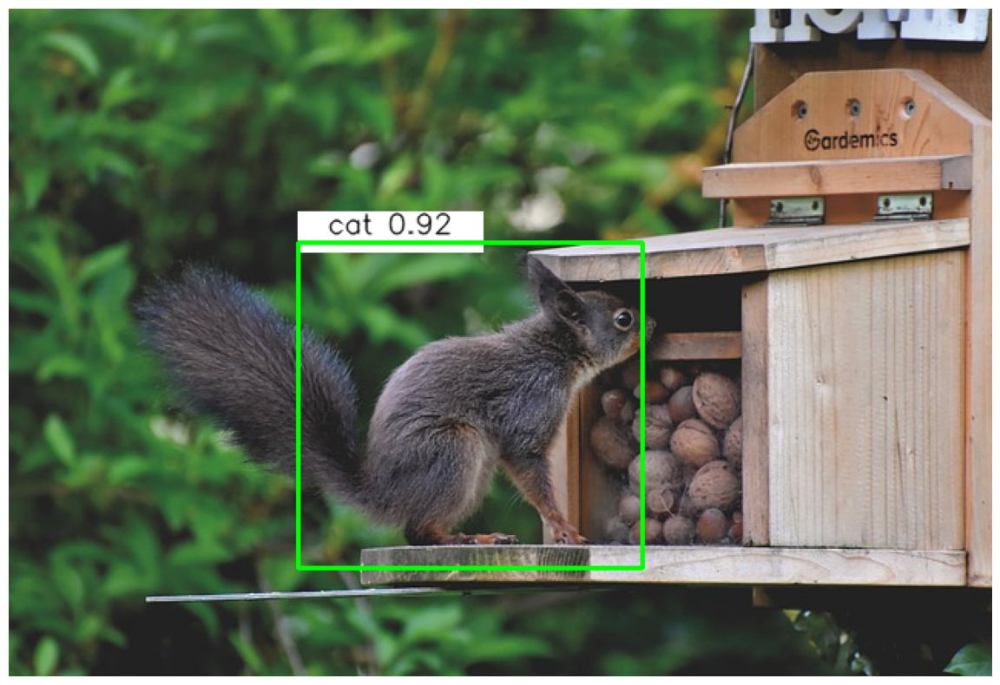

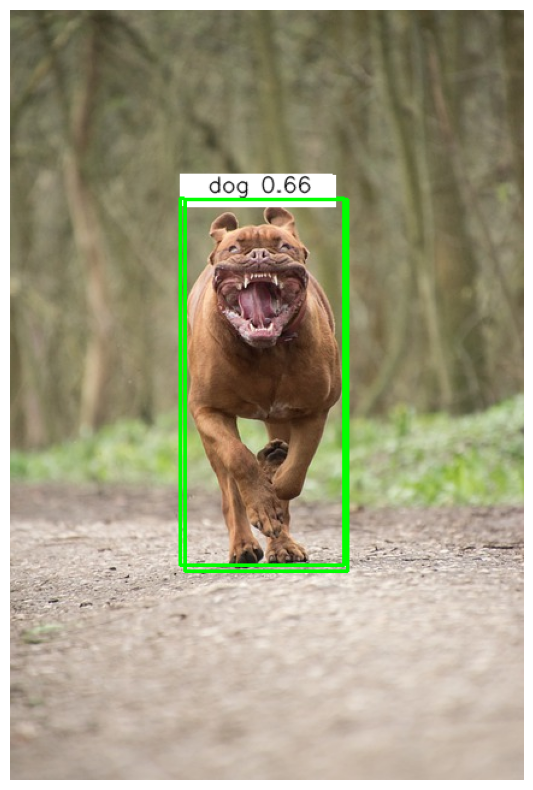

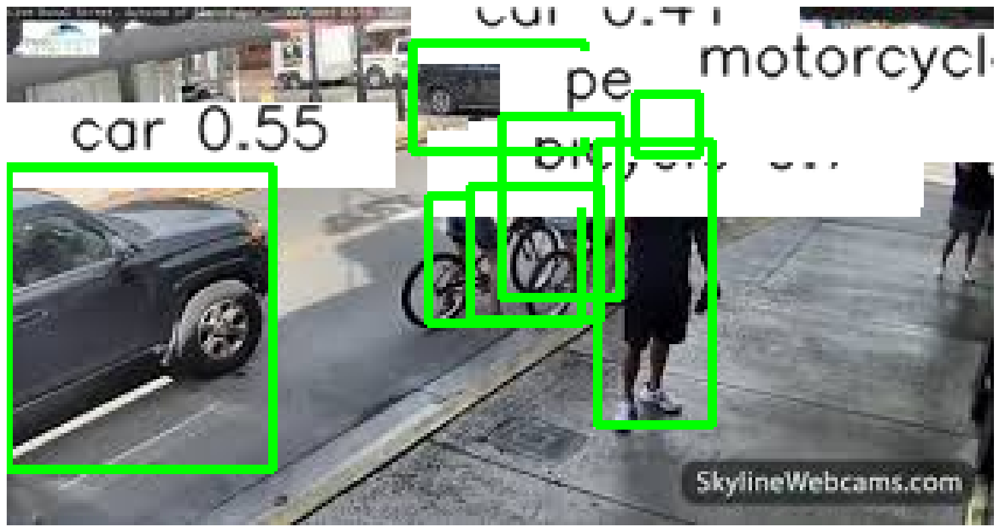

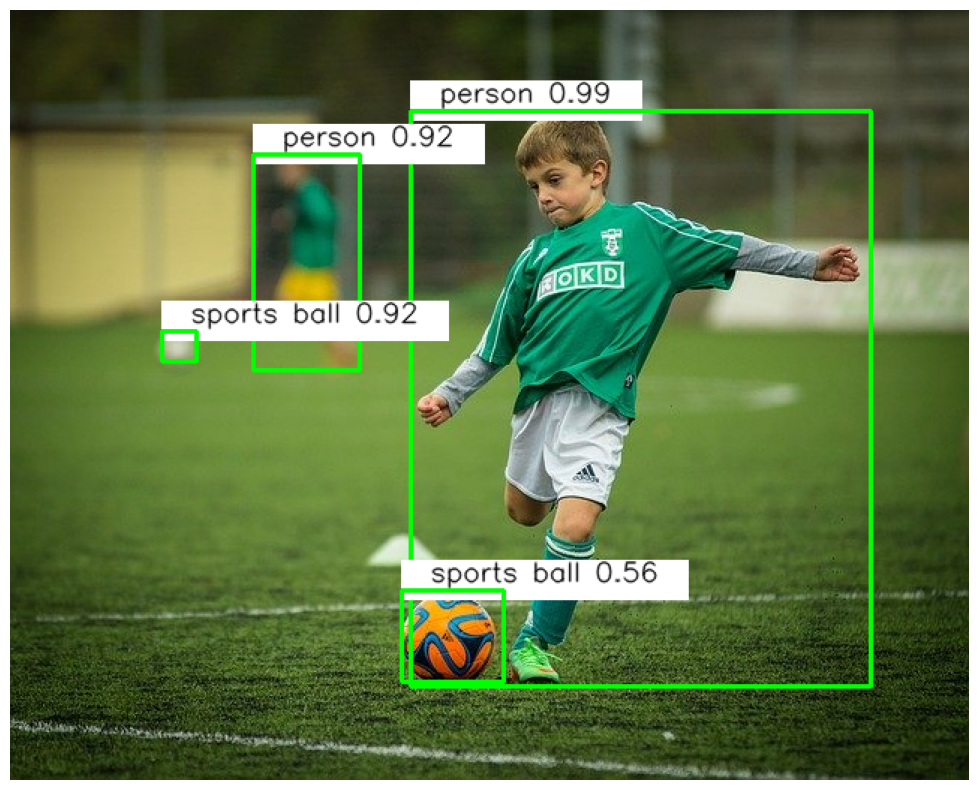

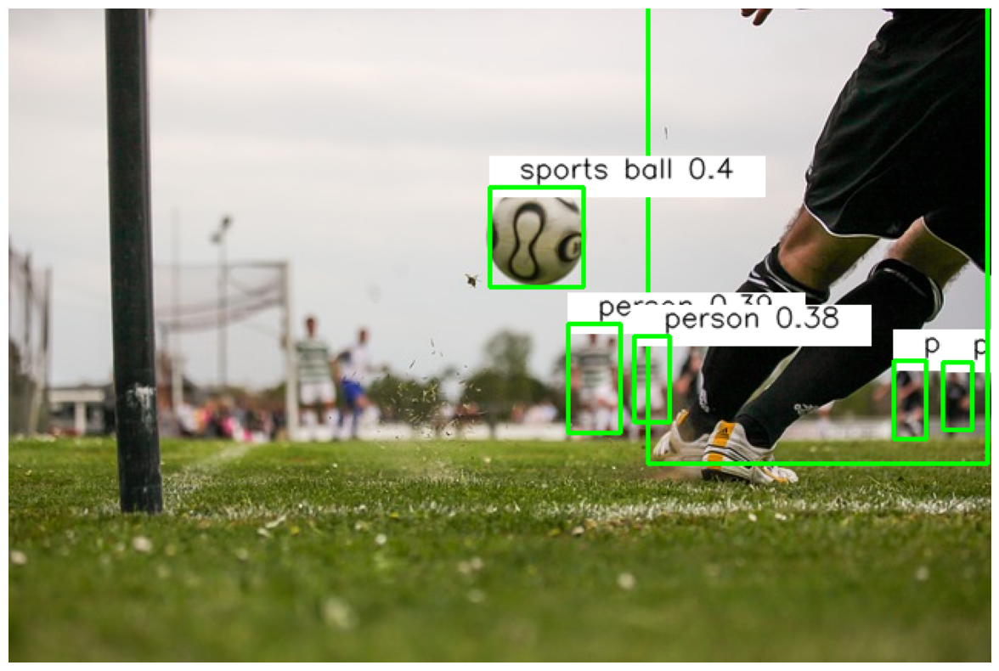

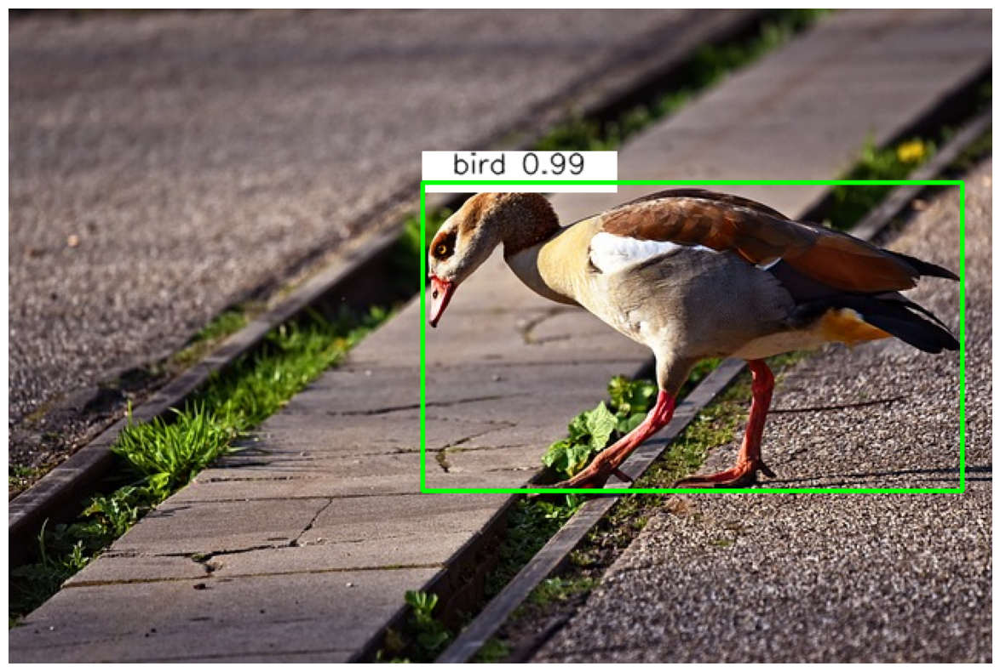

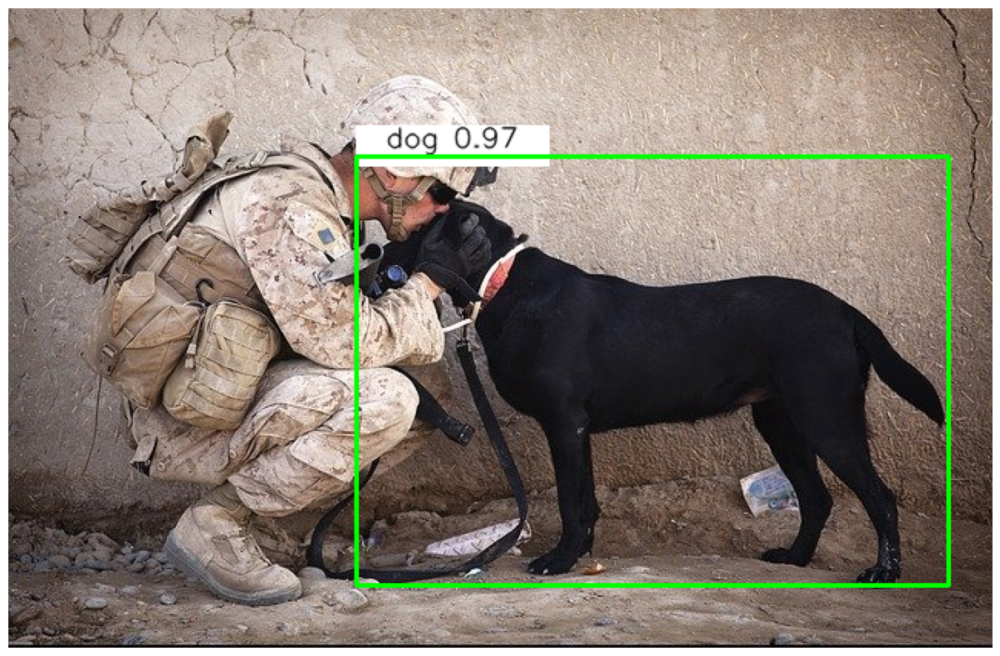

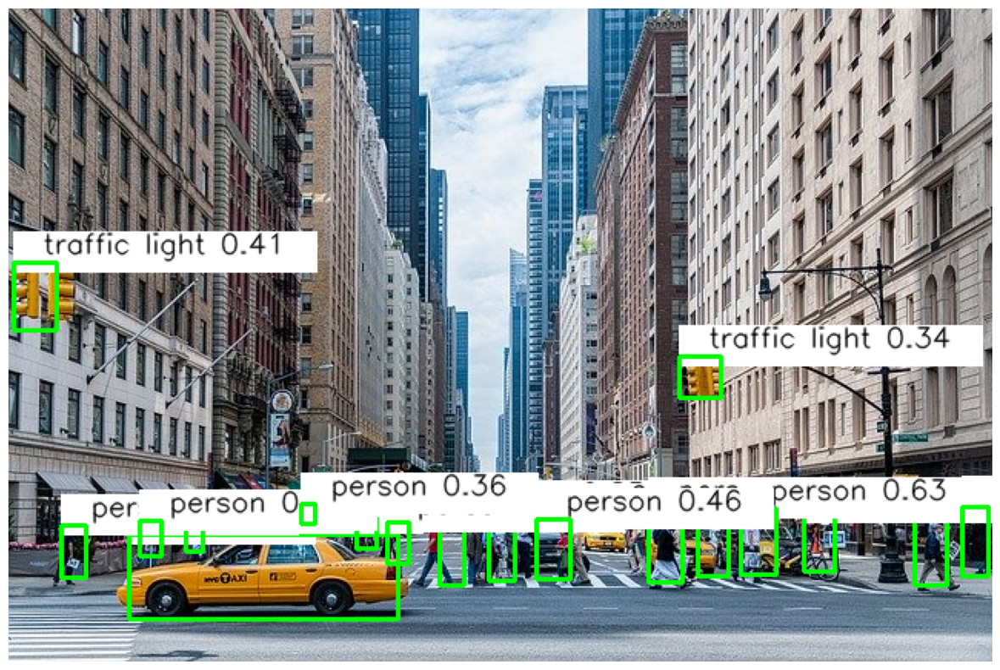

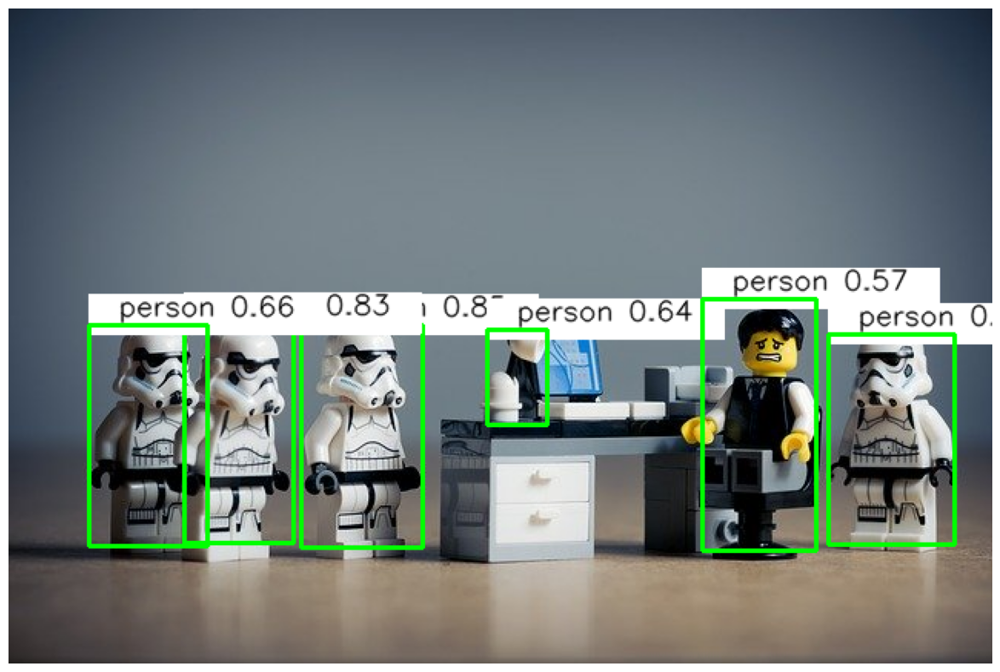

In [15]:
for i in range(1, 10):

    im = cv.imread(f"image_data/{i}.jpg")
    filtered_detections = ssd_detect_objects(ssd, im)
    ssd_display_objects_static(im, filtered_detections)

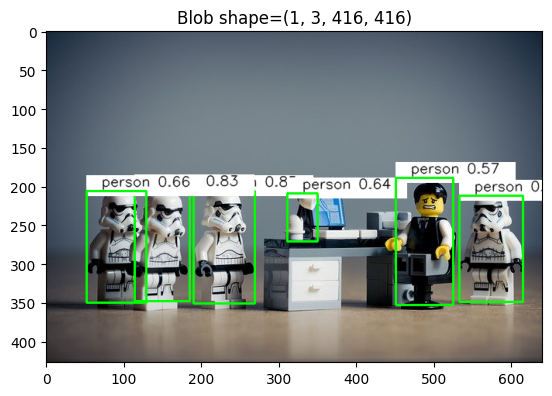

time= 0.029508113861083984
2
(507, 8)
(2028, 8)


In [ ]:
import time

img = cv.imread('image_data/persons.jpg')
cv.imshow('window',  img)
cv.waitKey(1)

# Load names of classes and get random colors
classes = open('models/ssd_mobilenet_v2_coco_2018_03_29/labels.txt').read().strip().split('\n')
np.random.seed(42)
colors = np.random.randint(0, 255, size=(len(classes), 3), dtype='uint8')

# Give the configuration and weight files for the model and load the network.
net = cv.dnn.readNetFromDarknet('models/yolo_mask/mask-yolov3-tiny-prn.cfg', 'models/yolo_mask/mask-yolov3-tiny-prn.weights')
net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
# net.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)

# determine the output layer
ln = net.getLayerNames()
output_layer_indices = net.getUnconnectedOutLayers()
ln = [ln[i - 1] for i in output_layer_indices.flatten()]

# construct a blob from the image
blob = cv.dnn.blobFromImage(img, 1/255.0, (416, 416), swapRB=True, crop=False)
r = blob[0, 0, :, :]

cv.imshow('blob', r)
text = f'Blob shape={blob.shape}'
plt.imshow(im[..., ::-1])  # Convert BGR to RGB
plt.title("Blob shape=(1, 3, 416, 416)")
plt.show()

net.setInput(blob)
t0 = time.time()
outputs = net.forward(ln)
t = time.time()
print('time=', t-t0)

print(len(outputs))
for out in outputs:
    print(out.shape)

def trackbar2(x):
    confidence = x/100
    r = r0.copy()
    for output in np.vstack(outputs):
        if output[4] > confidence:
            x, y, w, h = output[:4]
            p0 = int((x-w/2)*416), int((y-h/2)*416)
            p1 = int((x+w/2)*416), int((y+h/2)*416)
            cv.rectangle(r, p0, p1, 1, 1)
    cv.imshow('blob', r)
    text = f'Bbox confidence={confidence}'
    cv.displayOverlay('blob', text)

# Simulate blob data for testing
blob = np.random.random((1, 1, 416, 416)).astype(np.float32)
r0 = blob[0, 0, :, :]
r = r0.copy()

# Function to update the text with the trackbar
def trackbar2(x):
    confidence = x / 100.0  # Convert confidence to a range of 0-1
    display_image = r.copy()
    text = f"Bbox confidence={confidence:.2f}"
    cv.putText(display_image, text, (10, 30), cv.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    cv.imshow('blob', display_image)

# Display the image and create a trackbar
cv.imshow('blob', r)
cv.createTrackbar('confidence', 'blob', 50, 100, trackbar2)

# Initialize the display with default value
trackbar2(50)
cv.destroyAllWindows() 

boxes = []
confidences = []
classIDs = []
h, w = img.shape[:2]

for output in outputs:
    for detection in output:
        scores = detection[5:]
        classID = np.argmax(scores)
        confidence = scores[classID]
        if confidence > 0.5:
            box = detection[:4] * np.array([w, h, w, h])
            (centerX, centerY, width, height) = box.astype("int")
            x = int(centerX - (width / 2))
            y = int(centerY - (height / 2))
            box = [x, y, int(width), int(height)]
            boxes.append(box)
            confidences.append(float(confidence))
            classIDs.append(classID)

indices = cv.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
if len(indices) > 0:
    for i in indices.flatten():
        (x, y) = (boxes[i][0], boxes[i][1])
        (w, h) = (boxes[i][2], boxes[i][3])
        color = [int(c) for c in colors[classIDs[i]]]
        cv.rectangle(img, (x, y), (x + w, y + h), color, 2)
        text = "{}: {:.4f}".format(classes[classIDs[i]], confidences[i])
        cv.putText(img, text, (x, y - 5), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

cv.imshow('window', img)
cv.waitKey(0)
cv.destroyAllWindows()

#### Webcam inpunt detection 

In [ ]:
## Create video source
#cap = VideoSource(0)
#
## Show video
#win_name = "Object Detection"
#cv.namedWindow(win_name, cv.WINDOW_FREERATIO)
#
#while cv.waitKey(1) < 0:
#    has_frame, frame = cap.read()
#
#    if not has_frame:
#        
#        # release the video capture object
#        cap.release()
#
#        # close all windows
#        cv.destroyAllWindows()
#        break
#
#    objects = detect_objects(net, frame)
#    display_person_live(frame, objects)
#
#    cv.imshow(win_name, frame)

#### Test person cropping

In [ ]:
im = cv.imread("image_data/persons2.jpeg")
crops = crop_persons(im)

for i in range(len(crops)):
    cv.imshow(f"Person {i}", crops[i])
    mp_img = cv.cvtColor(crops[i], cv.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10)); plt.imshow(mp_img); plt.axis('off'), plt.show()